# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using Tensorflow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of a dog it is.

## 2. Data

The data we're using is from Kaggle's Dog breed identification competition

https://www.kaggle.com/c/dog-breed-identification

## 3. Evaluation

The evaluation is a file with predicted  probabilities for each dog breed of each test image.

www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:

* We're dealing with image(unstructured data) so its probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs(this means there are 120 different classes).
* there are around 10,000+ images in training set(this images have labels).
* There are around 10,000+ images in the test set(this images have no labels, because we'll eant to predict them).


In [1]:
# Unzip the uploaded data into Google Drive
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

## Get our workspace ready

* Import Tensorflow 2.x ✅
* Import Tensorflow Hub ✅
* Make sure we're using a GPU ✅

In [2]:
import os
# Must be set before importing tensorflow
os.environ["TF_USE_LEGACY_KERAS"] = "1"

In [3]:
#Import neccassary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)
print("TF version:", tf.__version__)

#check for GPU availability
print("GPU", "available" if  tf.config.list_physical_devices("GPU") else "not available:")

TF Hub version: 0.16.1
TF version: 2.19.0
GPU available


## Getting our data ready( turning into Tensors)

With all machine learning models ,our data has to be in numerical format. So that's what we'll doing first.Turning our images into Tensors(numerical representations).

Lets start by accessing our data and checking out the labels.

In [4]:
#Checkout the labels of our data
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [5]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

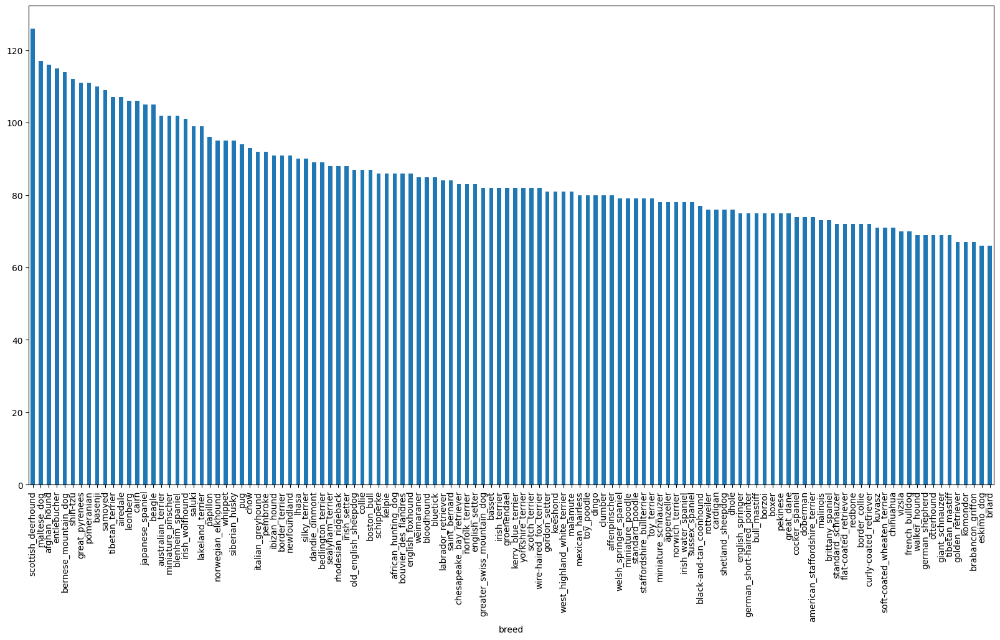

In [6]:
#how many images are there of each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [7]:
labels_csv["breed"].value_counts().median()

82.0

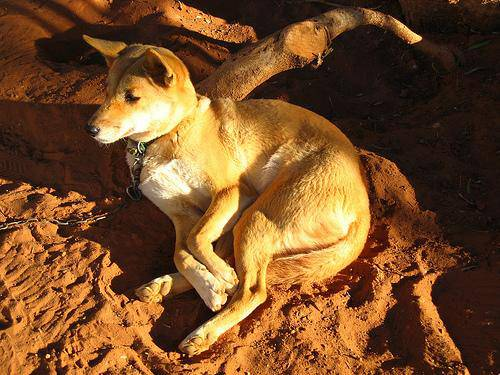

In [8]:
#lets view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting Images and thier labels

Lets get a list of all of our image file pathnames

In [9]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [10]:
#Create pathnames from Image IDs
filenames=["drive/My Drive/Dog Vision/train/"+ fname +".jpg" for fname in labels_csv["id"]]

#check the first 10
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
#Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) ==len(filenames):
  print("filenames match actual amount of files !!! Proceed.")
else:
  print("Filenames do not match actual amount of files,check the target directory.")

filenames match actual amount of files !!! Proceed.


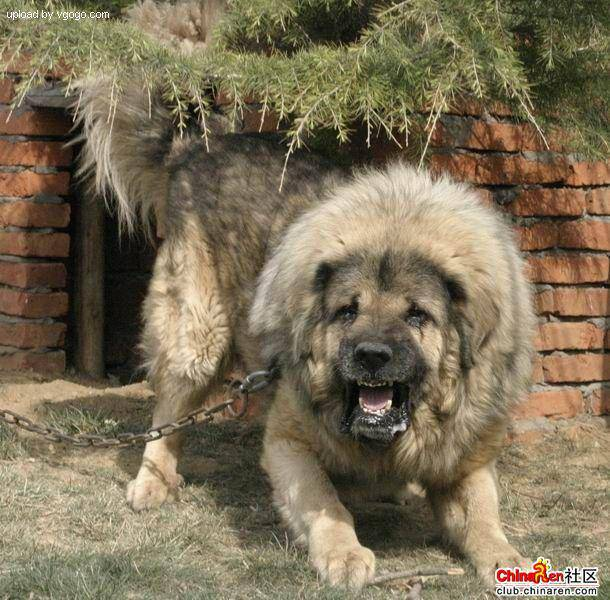

In [12]:
#one more check
Image(filenames[9000])

In [13]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list ,let's prepare our labels.

In [14]:
import numpy as np
labels=labels_csv["breed"].to_numpy()
# labels=np.array(labels) #does the same thing
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
len(labels)

10222

In [16]:
#see if number of labels matches the number of filenames
if len(labels)== len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("number of labels does not match number of filenames")

Number of labels matches number of filenames


In [17]:
# find the unique label values
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [18]:
# turn a single label into an array of booleans
print(labels[0])
labels[0]== unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [19]:
len(labels)

10222

In [20]:
#turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [21]:
len(boolean_labels)

10222

In [22]:
# Example: Turning boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds ==labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [23]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation sets

Since the dataset from Kaggle doesn't come with a validation set,we're going to create our own.

In [24]:
#setup X and Y variables
X=filenames
y=boolean_labels

In [25]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed

In [26]:
#Set number of images to use for experimenting
NUM_IMAGES= 1000 #@param {type:"slider", min:1000, max:10000, steps:1000}

In [27]:
#lets split our data into train and validation sets
from sklearn.model_selection import train_test_split

#Split them into training and validation of total size NUM_IMAGES
X_train,X_val, y_train,y_val=train_test_split(X[:NUM_IMAGES],
                                              y[:NUM_IMAGES],
                                              test_size=0.2,
                                              random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [28]:
# lest have a geex at the trainig data
X_train[:5], y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprocessing Images(turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable,`image`
3. Turn our `image` (a jpg into Tensors)
4. Normalize our image(convert color channel values from 0-255 to 0-1).
5. Resize teh image to be a shape of (224,224)
6. Return the modified image

before we do, lets see what importing an image looks like.

In [29]:
from matplotlib.pyplot import imread
image=imread(filenames[100])
image.shape

(500, 500, 3)

In [30]:
image.max(), image.min()

(np.uint8(255), np.uint8(0))

In [31]:
# turn image to tensor
tf.constant(image)

<tf.Tensor: shape=(500, 500, 3), dtype=uint8, numpy=
array([[[  1,   0,   0],
        [ 26,  25,  23],
        [  1,   0,   0],
        ...,
        [  0,   0,   0],
        [ 10,  10,   8],
        [  7,   7,   5]],

       [[  1,   0,   0],
        [ 11,  10,   8],
        [ 15,  14,  12],
        ...,
        [ 15,  15,  13],
        [  0,   0,   0],
        [  9,   9,   7]],

       [[  1,   0,   0],
        [ 29,  28,  26],
        [166, 165, 163],
        ...,
        [158, 158, 156],
        [ 11,  11,   9],
        [  0,   0,   0]],

       ...,

       [[  0,   0,   5],
        [  7,   6,  12],
        [135, 134, 140],
        ...,
        [ 18,  18,  18],
        [  4,   4,   4],
        [  0,   0,   0]],

       [[ 15,  14,  20],
        [  1,   0,   6],
        [ 21,  20,  26],
        ...,
        [  3,   3,   3],
        [  0,   0,   0],
        [  0,   0,   0]],

       [[  0,   0,   5],
        [  2,   1,   7],
        [  0,   0,   5],
        ...,
        [  0,   0,   

Now we've seen what an image looks like as a Tensor, lets make  a function to preprocess them.

In [32]:
# DEFINE image size
IMG_SIZE =224

# create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
   Takes an image file path and turns the image into a Tensor
   """
  #read in an image file
  image=tf.io.read_file(image_path)
  #turn the jpeg image into numerical Tensor with 3 color chanels(Red,green, Blue)
  image=tf.image.decode_jpeg(image, channels=3)
  #convert the color channel values to 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image, tf.float32)
  #resize the image to ur desired values (224,224)
  image=tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Lets say you're trying to process 10,000+ images in one go.. they all might not fit into memory

So that's why we do about 32(tis is batch size) images at a time(you can manually adjust the batch size if need be).

In order to use Tensorflow effectively , we need our data in the form of Tensor tuples which looks like this: `(image, label)`

In [33]:
# create a simple function to return a tuple (image,label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, process
  teh image and returns a type of (image,label).
  """

  image= process_image(image_path)
  return image,label

Now, we've got a way to turn our data into tuples of Tensors in the form `( image,label)` ,lets make a function to turn all of our data (x & y) into batches.

In [34]:
# define the batch size ,32 is a good start
BATCH_SIZE=32

#create a function to turn data into batches
def create_data_batches(X,y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates bacthes of data out of image(X) and label(y) pairs
  Shuffles the data if its training data but doesns't shuffle if its validation data.
  Also accepts test data as input(no labels).
  """
  # If the data is a test dataset, we probaly dont have labels
  if test_data:
    print("Creating test data bacthes..")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths(no labels)
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we dont need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                             tf.constant(y)))  #labels
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    #turn filepaths and labels into tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
    # shuffle pathnames and labels before mapping image process function is faster than shuffle
    data=data.shuffle(buffer_size=len(X))

    #create (image,label) tuples (this also turns the image path into a preprocessed image)
    data=data.map(get_image_label)

    #Turn the traing data into batches
    data_batch=data.batch(BATCH_SIZE)
  return data_batch

In [35]:
# Creating training and validation data batches
train_data= create_data_batches(X_train, y_train)
val_data= create_data_batches(X_val, y_val, valid_data=True)


Creating training data batches...
Creating validation data batches...


In [36]:
#check out the different  attributes of our dtaa batches
train_data.element_spec, val_data.element_spec


((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

#Visualizing Data Batches

Our data is now in bacthes,however thes can be a little hard to udersatnd/comprehend,lets visualize our data.

In [37]:
import matplotlib.pyplot as plt

#create a function for viewing images in a data batch.
def show_25_images(images,labels):
  """
  Displays 25 images from a data batch.
  """
  #setup the figure
  plt.figure(figsize=(10,10))
  #loop through 24 (for displaying 25 images)
  for i in range(25):
    #create suplots(5 row, 5 cols)
    ax=plt.subplot(5,5,i+1)
    #display an image
    plt.imshow(images[i])
    #Add teh image labela as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #turn the grid line off
    plt.axis("off")



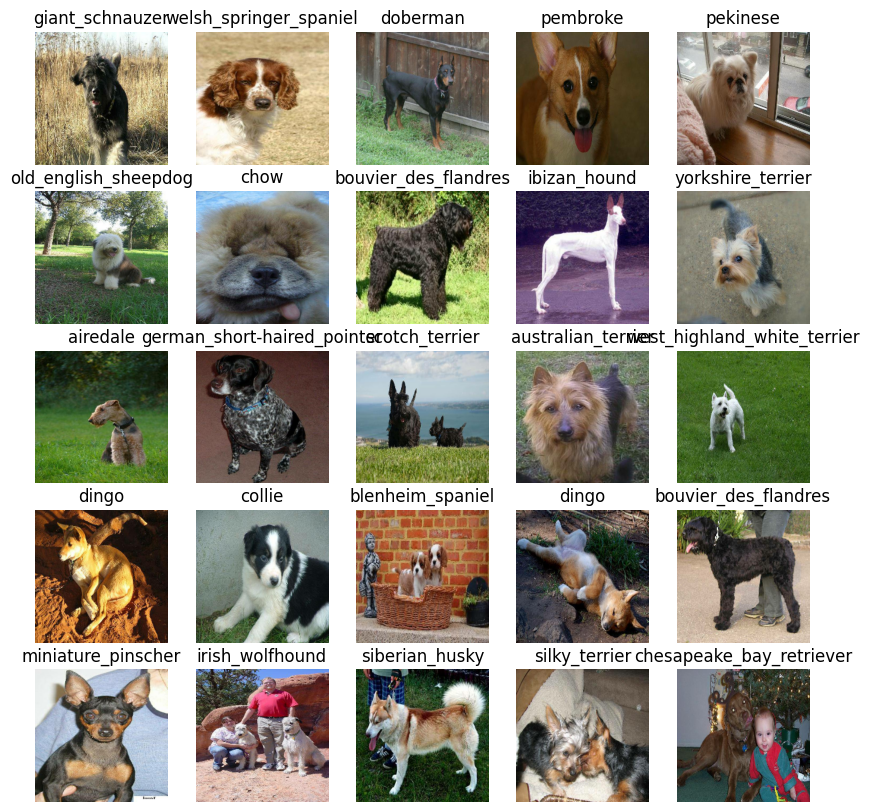

In [38]:
# Now lets visualize the dtaa in  training batch
train_images,train_labels=next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

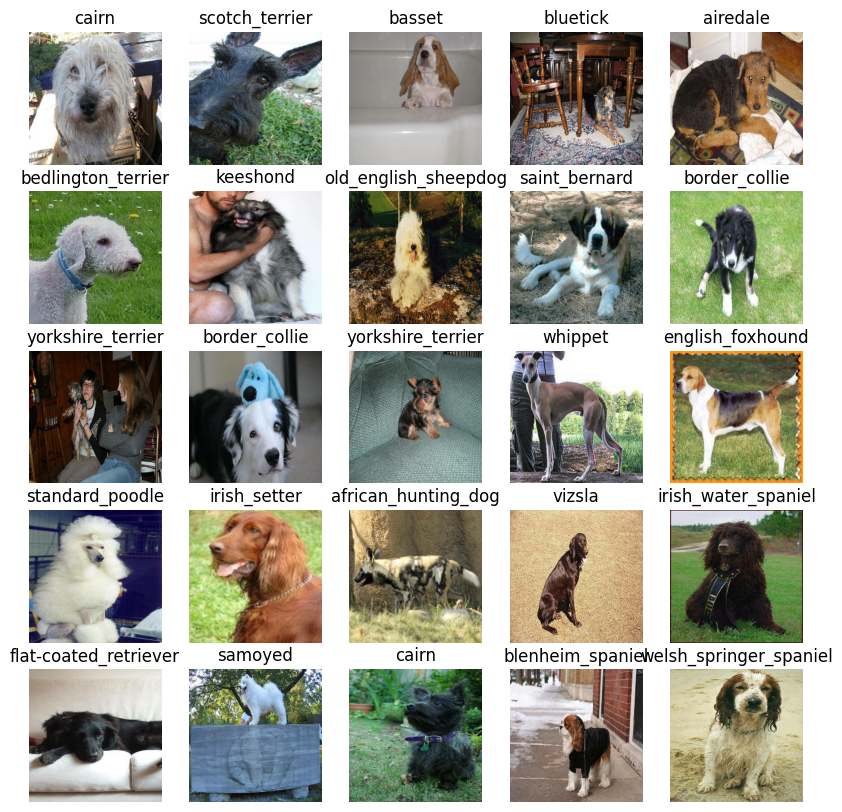

In [39]:
#now let visualize our validation set
val_images,val_labels= next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* the input shape( our image shape, in the form of Tensors) to our model.
* the output shape (image labels, in the form of tensors) of our model.
* the url of the model we want to use. from tensorflow hub- `tfhub.dev`

In [40]:
#Setup input shape to the model.
INPUT_SHAPE= [None, IMG_SIZE, IMG_SIZE,3] # btach, height,width, color channels

#Setup output shape of our model
OUTPUT_SHAPE=len(unique_breeds)

# Setup model url from Tensorflow hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"


Now we've got our inputs,outputs and model ready to go.
Let's put them together into a keras deep learning model.

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion(do this first, then this, then that).
*  Compiles the model (says it should be evaluated and improved).
* Builds the model( tells the model the input shape it'll be getting).
* returns the model.

All of thes steps can be found here: https://www.tensorflow.org/guide/keras

In [41]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model



In [42]:
model=create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks

callbacks are helper functions a model can use during training to do such things as save its progress.check its progress or stop training early if a model stops improving.

we'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorFlow Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load teh TensorBoard notebook extension
2. Create a TensorBoard callback which is abel to save logs to a directory and pass it to our model's `fit` function.
3. Visualize our model training logs with the `%tensorboard` magic function (we'll do this after model training)

In [43]:
# load TensorBoard notebook extension
%load_ext tensorboard

In [44]:
import datetime

#create a function to build a Tensorboard callback
def create_tensorboard_callback():
  #create a log directory for storing tensorboard logs
  logdir=os.path.join("drive/MyDrive/Dog Vision/logs",
                      # make it so the logs get tracked whenever we run an experiment
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


### Early Stopping callback

Early stopping helps our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [45]:
#create early stopping callback
early_stopping =tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                 patience= 3)


## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [46]:
NUM_EPOCHS =100 #@param {type:"slider",min:10, max:100, step:10}


In [47]:
# check to kake sure we'restill runing on GPU
print("gpu", "avaialable(yess!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

gpu avaialable(yess!!!)


#lets create  afunction which trains a model

* Create a model using `create_model()`
* setup a TensorBoard callback
using `create_tensorboard_callback()`
* call the `fit()` function on our model passing it the training dtaa, validation data, number of epochs to train for(`NUM_EPOCHS`) and the callbacks we'd like to use
* return the model.

In [48]:
# build a function to train and return a trained model
def train_model():
    """
    Trains a given model and returns the trained version
    """

    # create a model
    model = create_model()

    # create new tensorboard session every time we train a model
    tensorboard = create_tensorboard_callback()

    # fit the model to the data
    model.fit(
        x=train_data,
        epochs=NUM_EPOCHS,
        validation_data=val_data,
        validation_freq=1,
        callbacks=[tensorboard, early_stopping]
    )

    # return the fitted model
    return model


In [49]:
#fit the model to the data
model=train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 205s 8s/step - loss: 4.5114 - accuracy: 0.1112 - val_loss: 3.4357 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 4s 158ms/step - loss: 1.5965 - accuracy: 0.7125 - val_loss: 2.1980 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 4s 155ms/step - loss: 0.5477 - accuracy: 0.9475 - val_loss: 1.7260 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 5s 188ms/step - loss: 0.2472 - accuracy: 0.9937 - val_loss: 1.5430 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 5s 217ms/step - loss: 0.1435 - accuracy: 0.9962 - val_loss: 1.4696 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 4s 168ms/step - loss: 0.0988 - accuracy: 0.9987 - val_loss: 1.4281 - val_accuracy: 0.6450
Epoch 7/100
25/25 [================

**Note**: Overfitting to begin with is a good thing it means our model is learning!

### Checking the tensorboard logs

The TensorBoard magic function `%tensorboard` will access teh logs directory we created earlier and visualize its contents

In [50]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## making and evaluating predictions using a trained model

In [51]:
# Make predictions on the validation data( not used to train one)
predictions =model.predict(val_data, verbose=1)
predictions


7/7 [==============================] - 1s 115ms/step


array([[1.8246170e-03, 1.1927951e-04, 5.0029421e-04, ..., 4.2977452e-05,
        8.2184379e-05, 7.4632035e-04],
       [2.8747101e-03, 8.8122045e-04, 5.7266341e-03, ..., 1.8173933e-04,
        5.4532103e-03, 1.6304485e-04],
       [2.4936555e-04, 8.6966531e-05, 6.9106165e-05, ..., 1.3578222e-04,
        1.3412238e-04, 8.5732189e-04],
       ...,
       [3.0062979e-06, 3.6927063e-06, 4.7474882e-06, ..., 5.7353959e-06,
        5.4949196e-05, 3.2098047e-05],
       [1.0808645e-02, 2.4929381e-04, 6.6609238e-04, ..., 1.6581941e-04,
        1.0844048e-04, 5.7095094e-03],
       [1.0306491e-04, 2.9736042e-05, 8.4987283e-04, ..., 4.9116984e-03,
        2.4573799e-04, 2.0745478e-04]], dtype=float32)

In [52]:
np.sum(predictions[0])

np.float32(0.9999998)

In [53]:
# First prediction
index =42
print(predictions[index])
print(f"Max value (probability of prediction) : {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")


[4.58353497e-05 1.05227700e-04 1.95068031e-04 2.03504416e-04
 1.20893950e-02 9.76625961e-05 3.56269389e-04 1.76268863e-03
 6.67420961e-03 3.57701853e-02 2.91266115e-05 1.09086759e-05
 3.65712971e-04 4.92959144e-03 7.17233459e-04 7.96707533e-03
 1.18742983e-05 7.56301451e-04 4.95561224e-04 4.96187829e-04
 2.69149343e-04 8.21415510e-04 3.84798303e-04 1.75036785e-05
 1.58526413e-02 2.30466932e-04 4.96935354e-05 1.02594036e-04
 4.00599587e-04 6.48196947e-05 8.34150796e-06 6.15359095e-05
 8.44771566e-05 2.13430394e-05 2.40605499e-04 5.04566451e-05
 2.07618257e-04 5.61649678e-04 6.06230315e-05 2.73383826e-01
 1.26670173e-04 1.22833721e-04 5.66266477e-03 1.01081660e-05
 1.07676264e-04 2.83154543e-04 2.86985451e-04 1.62363879e-03
 1.01551297e-04 4.66603437e-04 6.16800899e-05 2.12094601e-04
 5.06608514e-04 1.93543290e-03 3.19146488e-06 1.51557883e-03
 8.93119723e-05 4.72061569e-04 1.60010241e-04 9.23156622e-05
 9.47124790e-05 3.77108314e-04 1.00268344e-05 1.04940191e-04
 2.90587759e-05 1.556182

Having this above functionality, is great but we want to be able to do it at scale

And it would be even better if we could see the image the prediction is being made on!

**Note**: Prediction probabilities are also known as confidence level. ⚾

In [54]:
#turn prediction probabilities into thier respective label(eaier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

#get a predicted label based on array of predicted probabilties
pred_label=get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in a batch dataset,
we'll have to unbatchify it to make predictions on the validation images and then compare teh predictions to the validation_labels(truth labels).

In [55]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [56]:
# Create a function to unbacth the dataset
def unbatchify(data):
  """
  turn batch dataset to normal(non-bcath) dataset
  """
  images=[]
  labels=[]
  #loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)
  return images,labels

#unbatchify
val_images,val_labels= unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels(truth labels)
* Validation images

Lets make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of turth labels and an array of integers and images
* Convert the prediction probabilities to a predicted label
* Plot the predicted label, its predicted proability, the truth label and target image on a single plot.

In [57]:
def plot_pred(prediction_probabilities, labels,images, n=1):
  """
  View the prediction , ground truth and image for sample n
  """
  pass